### Homework¶
1. Find a way to represent the entire time series in a single file. You may either save a visualization for every data on separate pages in a pdf or you may create an MP4 or GIF file. Make sure that for every frame, the correct date is indicated. Differentiate your answer from the template provided in at least 3 ways. Identify how your output is differentiated.

To begin, I will recreate the data from class in order to make a PDF of the time series.

In [5]:
import geopandas
import numpy as np
import pandas as pd

import datetime

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm

from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick
import datadotworld as dw

def import_covid_data(FIPS_name):
    # Load COVID19 county data using datadotworld API
    # Data provided by Johns Hopkins, file provided by Associated Press
    dataset = dw.load_dataset(
        "associatedpress/johns-hopkins-coronavirus-case-tracker",
        auto_update = True)
    
    #the dataset includes multiple dataframes. We will only use #2
    covid_data = dataset.dataframes[
        "2_cases_and_deaths_by_county_timeseries"]
    covid_data = covid_data[covid_data[FIPS_name] < 57000]
    covid_data = covid_data[covid_data[FIPS_name] > 0]
    # Transform FIPS codes into integers
    covid_data[FIPS_name] = covid_data[FIPS_name].astype(int)
    covid_data.set_index([FIPS_name, "date"], inplace = True)
    
    # Prepare a column for state abbreviations. we will draw these 
    # from state_dict
    covid_data["state_abr"] = ""
    for state, abr in state_dict.items():
        #.loc[row(s), col]
        covid_data.loc[
            covid_data["state"] == state, "state_abr"] = abr
    # save location name as Cass, ND 
    covid_data["Location"] = covid_data["location_name"] + ", " +\
        covid_data["state_abr"]
    return covid_data

    return covid_data


def import_geo_data(filename, index_col = "Date", FIPS_name = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename,                                   
                                   index_col = index_col)
    # rename fips code to match variable name in COVID-19 data
    map_data.rename(columns={"State":"state"},
                    inplace = True)
    # Combine statefips and county fips to create a single fips value
    # that identifies each particular county without referencing the 
    # state separately
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) + \
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    # set FIPS as index
    map_data.set_index(FIPS_name, inplace=True)
    
    return map_data

# I include this dictionary to convenienlty cross reference state names and
# state abbreviations.
state_dict = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ',
    'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 'Connecticut': 'CT', 
    'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 
    'Georgia': 'GA', 'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL',
    'Indiana': 'IN', 'Iowa': 'IA','Kansas': 'KS', 'Kentucky': 'KY',
    'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA',
    'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK',
    'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI',
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA',
    'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'}

fips_name = "fips_code"
# rename_FIPS matches map_data FIPS with COVID19 FIPS name
covid_data = import_covid_data(FIPS_name = fips_name)
covid_data

C:\Users\gwens\anaconda3\lib\site-packages\datadotworld\models\dataset.py:206: UserWarning: Unable to set data frame dtypes automatically using 2_cases_and_deaths_by_county_timeseries schema. Data types may need to be adjusted manually. Error: Integer column has NA values in column 2
  warnings.warn(


uid location_type location_name    state  \
fips_code date                                                        
1001      2020-01-22  84001001        county       Autauga  Alabama   
          2020-01-23  84001001        county       Autauga  Alabama   
          2020-01-24  84001001        county       Autauga  Alabama   
          2020-01-25  84001001        county       Autauga  Alabama   
          2020-01-26  84001001        county       Autauga  Alabama   
...                        ...           ...           ...      ...   
56045     2020-11-09  84056045        county        Weston  Wyoming   
          2020-11-10  84056045        county        Weston  Wyoming   
          2020-11-11  84056045        county        Weston  Wyoming   
          2020-11-12  84056045        county        Weston  Wyoming   
          2020-11-13  84056045        county        Weston  Wyoming   

                      total_population  cumulative_cases  \
fips_code date                                             
1001      2020-01-22           55200.0                 0   
          2020-01-23           55200.0                 0   
          2020-01-24           55200.0                 0   
          2020-01-25           55200.0                 0   
          2020-01-26           55200.0                 0   
...                                ...               ...   
56045     2020-11-09            7100.0               310   
          2020-11-10            7100.0               321   
          2020-11-11            7100.0               323   
          2020-11-12            7100.0               321   
          2020-11-13            7100.0               330   

                      cumulative_cases_per_100_000  cumulative_deaths  \
fips_code date                                                          
1001      2020-01-22                          0.00                  0   
          2020-01-23                          0.00                  0   
          2020-01-24                          0.00                  0   
          2020-01-25                          0.00                  0   
          2020-01-26                          0.00                  0   
...                                            ...                ...   
56045     2020-11-09                       4366.20                  0   
          2020-11-10                       4521.13                  0   
          2020-11-11                       4549.30                  0   
          2020-11-12                       4521.13                  0   
          2020-11-13                       4647.89                  0   

                      cumulative_deaths_per_100_000  new_cases  new_deaths  \
fips_code date                                                               
1001      2020-01-22                            0.0        NaN         NaN   
          2020-01-23                            0.0        0.0         0.0   
          2020-01-24                            0.0        0.0         0.0   
          2020-01-25                            0.0        0.0         0.0   
          2020-01-26                            0.0        0.0         0.0   
...                                             ...        ...         ...   
56045     2020-11-09                            0.0        4.0         0.0   
          2020-11-10                            0.0       11.0         0.0   
          2020-11-11                            0.0        2.0         0.0   
          2020-11-12                            0.0       -2.0         0.0   
          2020-11-13                            0.0        9.0         0.0   

                      new_cases_per_100_000  new_deaths_per_100_000  \
fips_code date                                                        
1001      2020-01-22                    NaN                     NaN   
          2020-01-23                   0.00                     0.0   
          2020-01-24                   0.00                     0.0   
  

Add the geodata in order to create the map.

In [4]:
map_data = import_geo_data(filename = "countiesWithStatesAndPopulation.shp",
                    index_col = "Date", FIPS_name= fips_name)
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
...,...,...,...,...,...,...,...,...,...,...,...
31073,31,073,00835858,0500000US31073,Gosper,06,1186616237,11831826,1990.0,Nebraska,"POLYGON ((-100.09510 40.43866, -100.08937 40.4..."
39075,39,075,01074050,0500000US39075,Holmes,06,1094405866,3695230,43960.0,Ohio,"POLYGON ((-82.22066 40.66758, -82.19327 40.667..."
48171,48,171,01383871,0500000US48171,Gillespie,06,2740719114,9012764,26988.0,Texas,"POLYGON ((-99.30400 30.49983, -99.28234 30.499..."


Check to see if the geo data is functioning by seeing the population of the whole map.

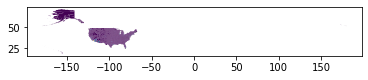

In [7]:
map_data.plot(column = "Population")

The county-level data still needs to be geocoded. The following code will create a geodataframe for each data. Then we can add the Covid data for each date. Then the dataframes can be stacked to show the time series.

In [10]:
def create_merged_geo_dataframe(data, map_data, dates):
    data_frame_initialized = False
    counties = sorted(
        list(
            set(data.index.get_level_values("fips_code"))))
    for date in dates:
        # select county observations from each date in dates
        # select only the subset of counties in the map that
        # are also present in the covid_data
        agg_df = map_data.loc[counties]
        agg_df["date"] = date
        if data_frame_initialized == False:
            #Create new dataframe
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            data_frame_initialized = True        
        
        else:
            # or stack thenew  data frame and the dataframe that was initialized at
            # i = 0
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)
    # reset index, then set to [fips, date]
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    
    for key, val in data.items():
        matching_gpd[key] = val
    return matching_gpd

dates = sorted(list(set(covid_data.index.get_level_values("date"))))
covid_data = create_merged_geo_dataframe(covid_data, map_data, dates)
covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,cumulative_deaths,cumulative_deaths_per_100_000,new_cases,new_deaths,new_cases_per_100_000,new_deaths_per_100_000,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Autauga, AL"
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Baldwin, AL"
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Barbour, AL"
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Bibb, AL"
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,AL,"Blount, AL"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2020-11-13,56,037,01609192,0500000US56037,Sweetwater,06,27005754244,166230251,42343.0,Wyoming,...,4,9.07,47.0,0.0,106.53,0.0,44.29,0.00,WY,"Sweetwater, WY"
56039,2020-11-13,56,039,01605083,0500000US56039,Teton,06,10351784301,570864879,23464.0,Wyoming,...,2,8.67,42.0,0.0,182.14,0.0,26.57,0.00,WY,"Teton, WY"
56041,2020-11-13,56,041,01605084,0500000US56041,Uinta,06,5391631764,16625817,20226.0,Wyoming,...,4,19.41,22.0,0.0,106.75,0.0,20.57,0.14,WY,"Uinta, WY"


In order to accurately compare data, population needs to be taken into account. The daily rate of new cases and deaths per million will be calculated.

In [12]:
def create_new_vars(covid_data, moving_average_days):
    #use a for loop that performs the same ops for cases and deaths
    for key in ("cases", "deaths"):
        cap_key = key.title()
        covid_data[cap_key + " per Million"] = covid_data["cumulative_" + key]\
            .div(covid_data["total_population"]).mul(10 ** 6) 
        #group by county ("fips_code")
        covid_data["Daily " + cap_key + " per Million"] = \
            covid_data["cumulative_" + key ].groupby(covid_data.index.names[0])\
            .diff(1).div(covid_data["total_population"]).mul(10 ** 6)
        covid_data["Daily " + cap_key + " per Million MA"] = covid_data["Daily " + \
                  cap_key + " per Million"].rolling(moving_average_days).mean()
        
moving_average_days = 7
create_new_vars(covid_data,moving_average_days)

covid_data

,,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,...,new_cases_7_day_rolling_avg,new_deaths_7_day_rolling_avg,state_abr,Location,Cases per Million,Daily Cases per Million,Daily Cases per Million MA,Deaths per Million,Daily Deaths per Million,Daily Deaths per Million MA
fips_code,date,,,,,,,,,,,,,,,,,,,,,
1001,2020-01-22,1,001,00161526,0500000US01001,Autauga,06,1539602123,25706961,55869.0,Alabama,...,NaN,NaN,AL,"Autauga, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1003,2020-01-22,1,003,00161527,0500000US01003,Baldwin,06,4117546676,1133055836,223234.0,Alabama,...,NaN,NaN,AL,"Baldwin, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1005,2020-01-22,1,005,00161528,0500000US01005,Barbour,06,2292144655,50538698,24686.0,Alabama,...,NaN,NaN,AL,"Barbour, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1007,2020-01-22,1,007,00161529,0500000US01007,Bibb,06,1612167481,9602089,22394.0,Alabama,...,NaN,NaN,AL,"Bibb, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
1009,2020-01-22,1,009,00161530,0500000US01009,Blount,06,1670103911,15015423,57826.0,Alabama,...,NaN,NaN,AL,"Blount, AL",0.000000,NaN,NaN,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2020-11-13,56,037,01609192,0500000US56037,Sweetwater,06,27005754244,166230251,42343.0,Wyoming,...,44.29,0.00,WY,"Sweetwater, WY",22462.996124,1065.348958,1146.041967,90.667996,0.0,0.0
56039,2020-11-13,56,039,01605083,0500000US56039,Teton,06,10351784301,570864879,23464.0,Wyoming,...,26.57,0.00,WY,"Teton, WY",48050.652674,1821.414632,1131.552863,86.734030,0.0,0.0
56041,2020-11-13,56,041,01605084,0500000US56041,Uinta,06,5391631764,16625817,20226.0,Wyoming,...,20.57,0.14,WY,"Uinta, WY",33286.428259,1067.494784,1167.338766,194.089961,0.0,0.0


Again, we will call all the mapping tools and include only the lower 48 states by setting bounds on the map. We will instead do Cases per Million

In [24]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick

def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data

date = dates[-1]

#map bounds
if "map_bounded" not in locals():
    minx = -127
    miny = 23
    maxx = -66
    maxy = 48
    covid_data = select_data_within_bounds(covid_data, minx, miny, maxx, maxy)
    covid_map_bounded = True

In order to make the graph more readable, we can divide the colors into distinct categories. We can also use more colors to see more distinction between deaths per million. Let's just add the colorbar right away too.

And we will plot all 4 graphs: Cases per Million, Deaths per Million, Daily Cases moving average, Daily Deaths moving average

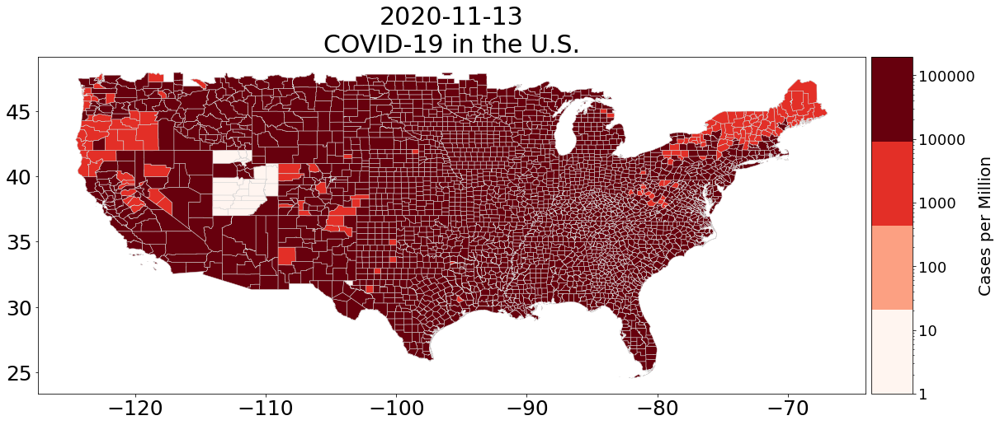

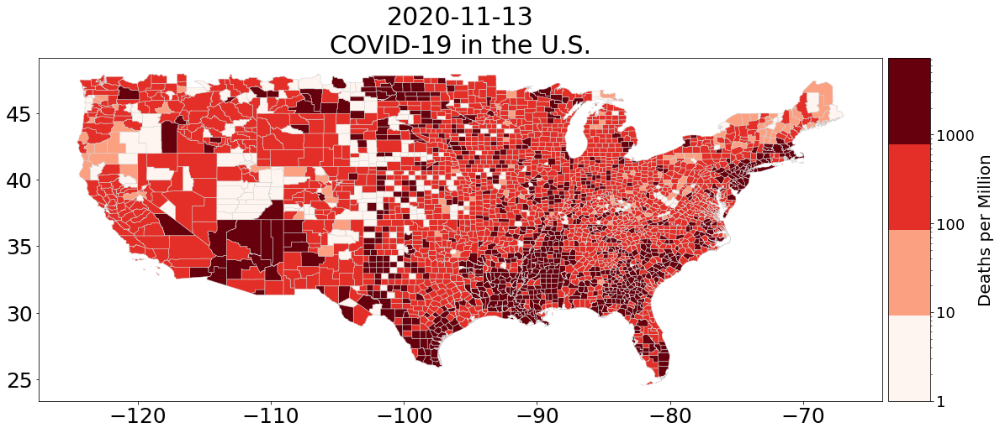

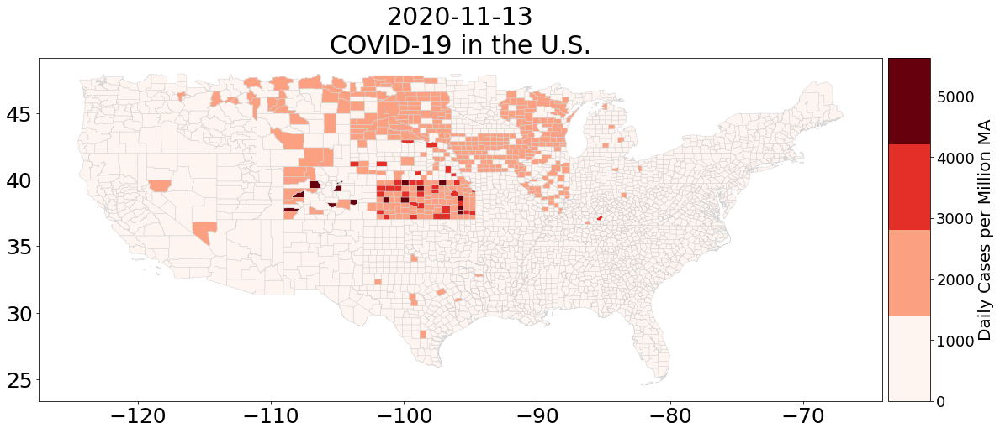

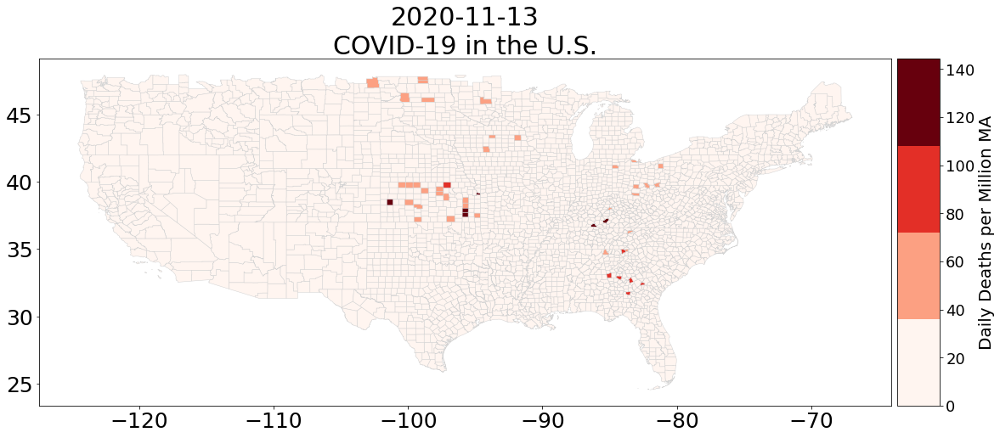

In [25]:
keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]
for key in keys:
    log = False if "Daily" in key else True
    fig, ax = plt.subplots(figsize=(19,9),
        subplot_kw = {'aspect': 'equal'})   
    plt.rcParams.update({"font.size": 30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    # this time we replace 0 values with 1
    # so that these values show up as beige instead of as white
    # when color axis is logged
    df = covid_data[covid_data.index.get_level_values("date")==date].replace(0,1)
    # set range of colorbar
    vmin = 1 if log else 0 
    vmax = df[key].max()
    # choose colormap
    cmap = cm.get_cmap('Reds', 4)
    # format colormap
    if log:
        norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
    else:
        norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    # empty array for the data range
    sm._A = []
    # prepare space for colorbar
    divider = make_axes_locatable(ax)
    size = "5%" 
    cax = divider.append_axes("right", size = size, pad = 0.1)
    # add colorbar to figure
    cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)

    # format colorbar values as int
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize = 20)


    df.plot(ax=ax, cax = cax, column=key, vmin=vmin ,vmax = vmax, 
                 cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                 norm = norm)
    ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

    plt.show()
    plt.close()

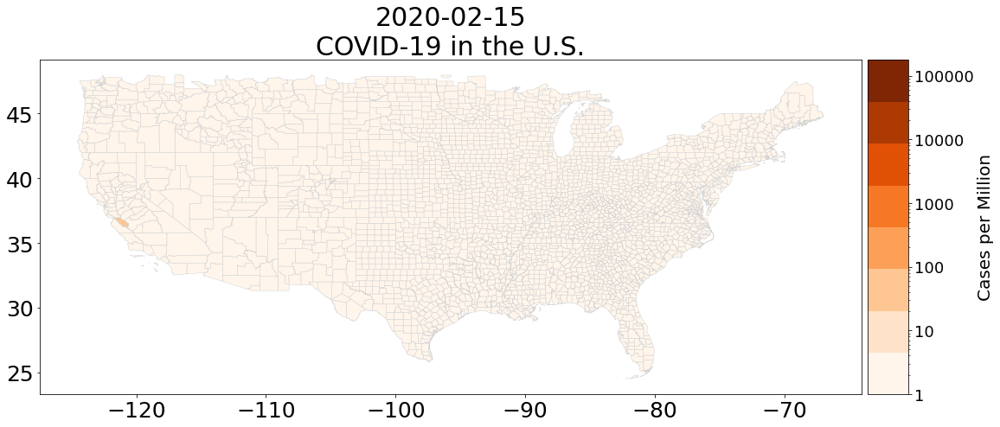

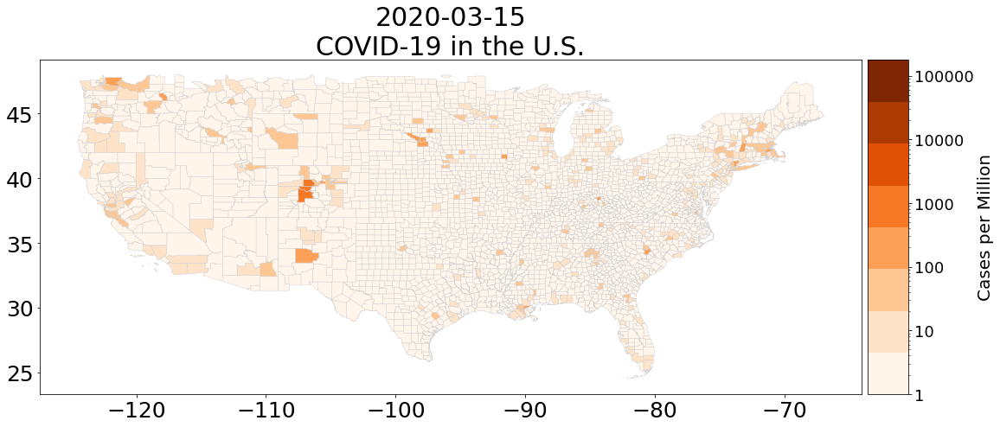

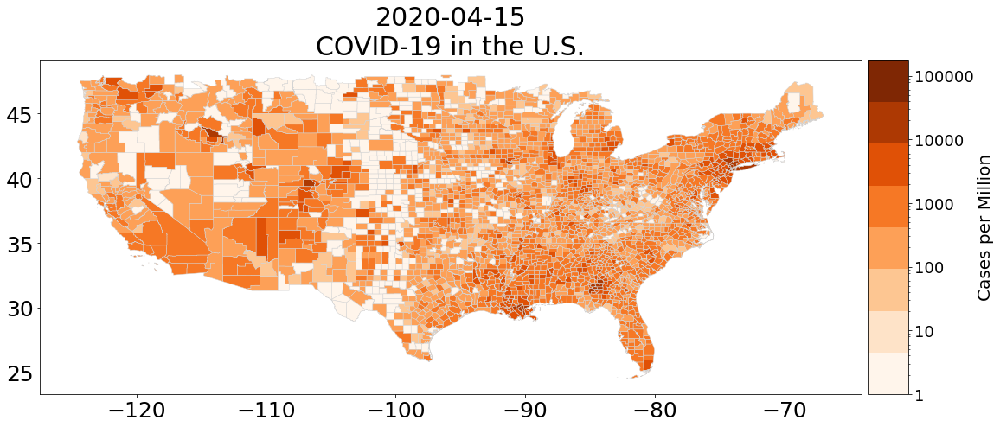

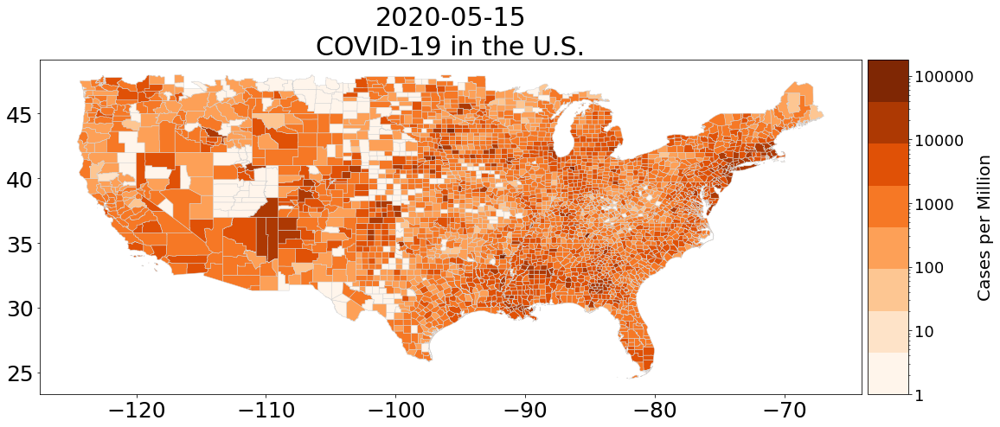

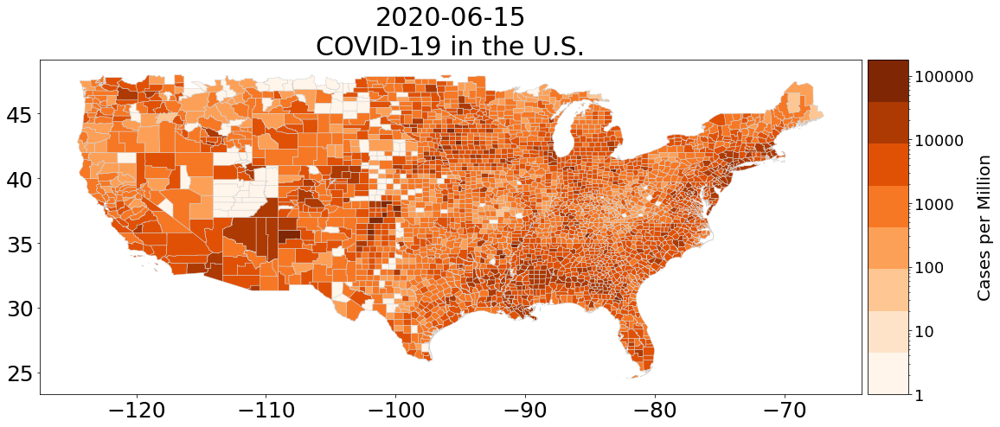

...

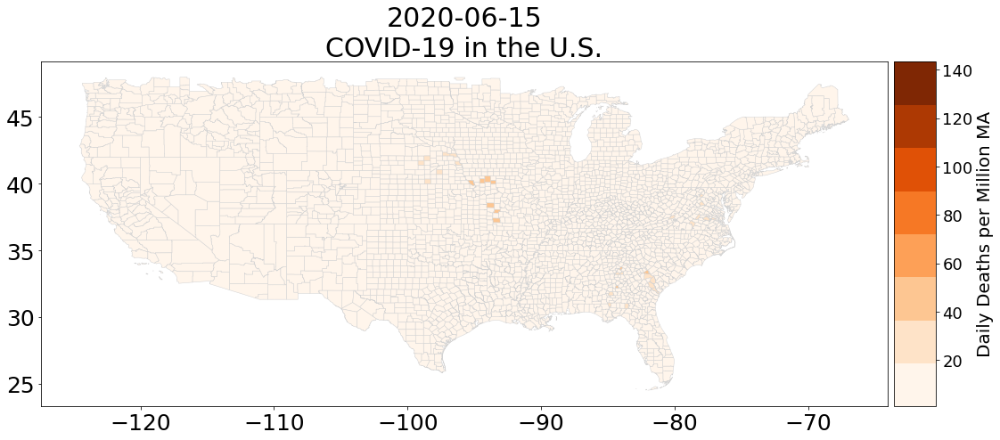

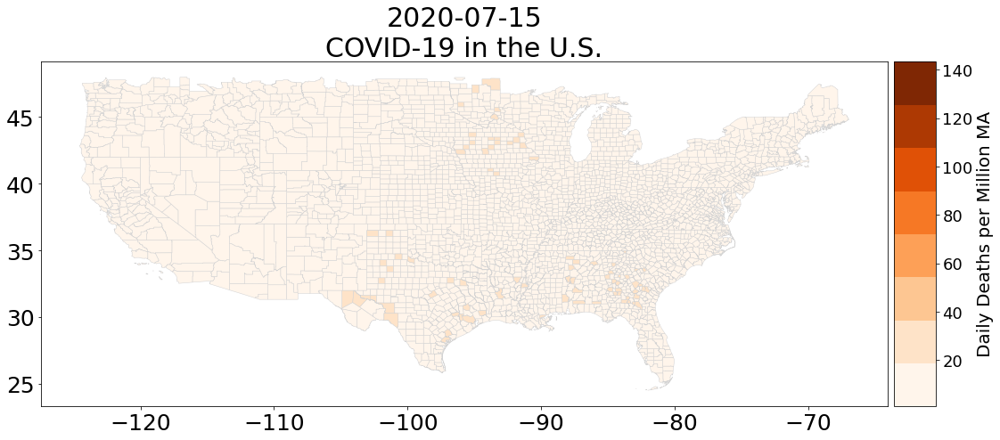

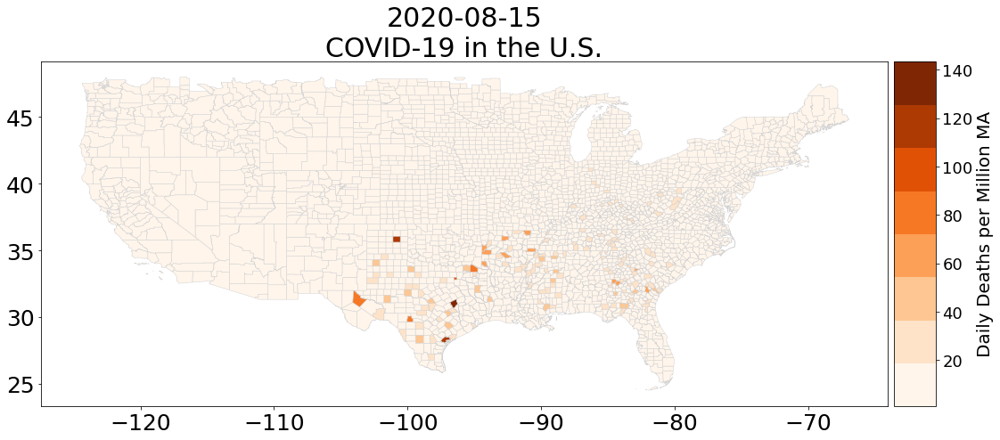

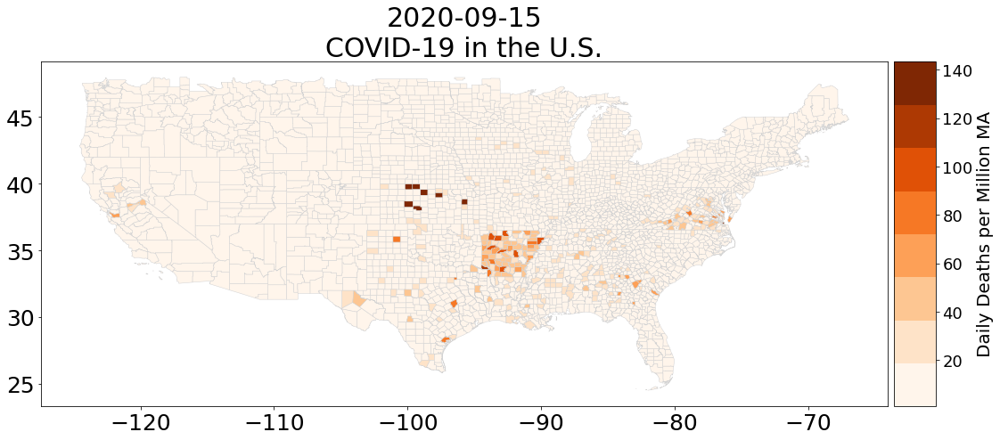

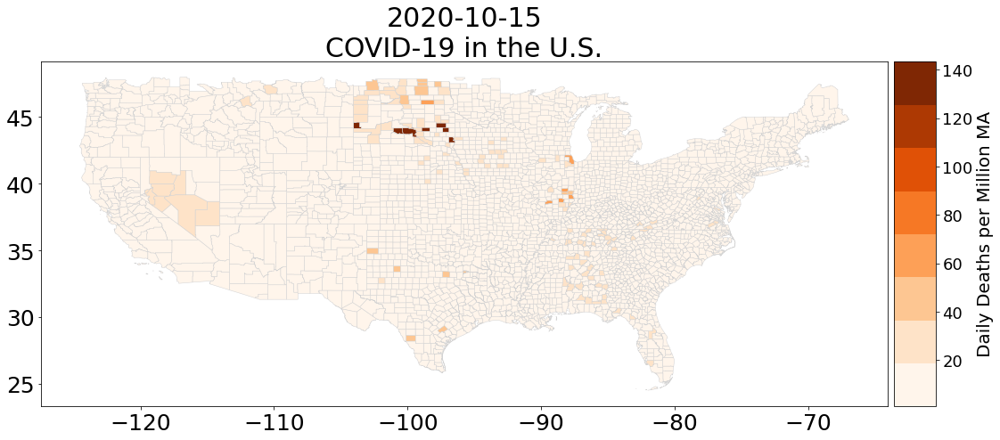

In [35]:
import geopandas
import numpy as np
import pandas as pd
import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
# If you choose to make a dynamic visualization for the homework
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages

pp = PdfPages("New_Covid19_Map.pdf")

keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million MA", "Daily Deaths per Million MA"]

dates = sorted(list(set(covid_data.index.get_level_values("date"))))
dates = [date for date in dates if "15" in date]

for key in keys:
    vmin = 1 
    vmax = df[key].max()
    
    for date in dates:
        log = False if "Daily" in key else True
        fig, ax = plt.subplots(figsize=(18,8),
            subplot_kw = {'aspect': 'equal'})   
        plt.rcParams.update({"font.size": 30})
        plt.xticks(fontsize = 25)
        plt.yticks(fontsize = 25)
        # this time we replace 0 values with 1
        # so that these values show up as beige instead of as white
        # when color axis is logged
        df = covid_data[covid_data.index.get_level_values("date")==date].replace(0,1)
 
        # choose colormap
        cmap = cm.get_cmap('Oranges', 8)
        # format colormap
        if log:
            norm = cm.colors.LogNorm(vmin=vmin, vmax =vmax)
        else:
            norm = cm.colors.Normalize(vmin = vmin, vmax = vmax)
        sm = cm.ScalarMappable(cmap=cmap, norm=norm)
        # empty array for the data range
        sm._A = []
        # prepare space for colorbar
        divider = make_axes_locatable(ax)
        size = "5%" 
        cax = divider.append_axes("right", size = size, pad = 0.1)
        # add colorbar to figure
        cbar = fig.colorbar(sm, cax=cax, cmap = cmap)
        cbar.ax.tick_params(labelsize=18)
        vals = list(cbar.ax.get_yticks())
        vals.append(vmax)

        # format colorbar values as int
        cbar.ax.set_yticklabels([int(x) for x in vals])
        cbar.ax.set_ylabel(key, fontsize = 20)


        df.plot(ax=ax, cax = cax, column=key, vmin=vmin ,vmax = vmax, 
                     cmap = cmap, legend=False, linewidth=.5, edgecolor='lightgrey', 
                     norm = norm)
        ax.set_title(str(date)[:10] + "\n" + "COVID-19 in the U.S.", fontsize = 30)

        plt.show()
        pp.savefig(fig, bbox_inches="tight")
        plt.close()
        
pp.close()

I did oranges instead of reds for better visibility. I also upped the number of colors of orange to 8 because now that the rates are so high, it seems to differentiate between them better. 

In [161]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime

wheat_data = pd.read_csv("SpringWheatYieldbyCounty.csv",
                    index_col = [0, 2])
wheat_data.dropna()

,,County,Yield
fips_code,date,,
38031,2019,FOSTER,52.5
38043,2019,KIDDER,36.9
38093,2019,STUTSMAN,43.5
38003,2019,BARNES,52.6
38017,2019,CASS,48.9
...,...,...,...
38025,1989,DUNN,18.0
38053,1989,MCKENZIE,20.5
38055,1989,MCLEAN,16.6


In [172]:
def import_wheat_data(filename, fips_code):
    # wheat data using read csv
    wheat_data = pd.read_csv("SpringWheatYieldbyCounty.csv",
                    index_col = [0, 2])

    wheat_data[fips_code] = wheat_data[fips_code].astype(int)
    wheat_data.set_index([fips_code, "date"], inplace = True)
    
    return wheat_data

wheat_data.dropna()

,,County,Yield
fips_code,date,,
38031,2019,FOSTER,52.5
38043,2019,KIDDER,36.9
38093,2019,STUTSMAN,43.5
38003,2019,BARNES,52.6
38017,2019,CASS,48.9
...,...,...,...
38025,1989,DUNN,18.0
38053,1989,MCKENZIE,20.5
38055,1989,MCLEAN,16.6


In [163]:
def import_geo_data(filename, index_col = "date", fips_code = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename,                                   
                                   index_col = index_col)
    # rename fips code to match variable name in COVID-19 data
    map_data.rename(columns={"State":"state"},
                    inplace = True)
    # Combine statefips and county fips to create a single fips value
    # that identifies each particular county without referencing the 
    # state separately
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) + \
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    # set FIPS as index
    map_data.set_index(FIPS_name, inplace=True)
    
    return map_data

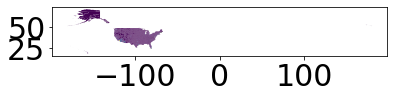

In [164]:
map_data.plot(column = "Population")

In [165]:
map_data = import_geo_data(filename = "countiesWithStatesAndPopulation.shp",
                    index_col = "date", fips_code= FIPS_name)

In [166]:
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
...,...,...,...,...,...,...,...,...,...,...,...
31073,31,073,00835858,0500000US31073,Gosper,06,1186616237,11831826,1990.0,Nebraska,"POLYGON ((-100.09510 40.43866, -100.08937 40.4..."
39075,39,075,01074050,0500000US39075,Holmes,06,1094405866,3695230,43960.0,Ohio,"POLYGON ((-82.22066 40.66758, -82.19327 40.667..."
48171,48,171,01383871,0500000US48171,Gillespie,06,2740719114,9012764,26988.0,Texas,"POLYGON ((-99.30400 30.49983, -99.28234 30.499..."


In [176]:
dates = ["2019",
        "2018",
        "2017",
        "2016",
        "2015",
        "2014",
        "2013",
        "2012",
        "2011",
        "2010",
        "2009",
        "2008",
        "2007",
        "2006",
        "2005",
        "2004",
        "2003",
        "2002",
        "2001",
        "2000",
        "1999",
        "1998",
        "1997",
        "1996",
        "1995",
        "1994",
        "1993",
        "1992",
        "1991",
        "1990",
        "1989"]

In [177]:
def create_wheat_geo_dataframe(wheat_data, map_data, dates):
    # create geopandas dataframe with multiindex for date
    # original geopandas dataframe had no dates, so copies of the df are 
    # stacked vertically, with a new copy for each date in the covid_data index
    #(dates is a global)
    data_frame_initialized = False
    counties = wheat_data.groupby("fips_code").mean().index
    for date in dates:
        # select county observations from each date in dates
        # select only the subset of counties in the map that
        # are also present in the covid_data
        agg_df = map_data.loc[counties]
        agg_df["date"] = date
        if data_frame_initialized == False:
            #Create new dataframe
            matching_gpd = geopandas.GeoDataFrame(agg_df, crs = map_data.crs)
            data_frame_initialized = True        
        
        else:
            # or stack thenew  data frame and the dataframe that was initialized at
            # i = 0
            matching_gpd = matching_gpd.append(agg_df, ignore_index = False)
    # reset index, then set to [fips, date]
    matching_gpd.reset_index(inplace=True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    
    for key, val in data.items():
        matching_gpd[key] = val
    return matching_gpd

# . . . to end of script . . .
# dates will be used to create a geopandas DataFrame with multiindex 
dates = sorted(list(set(wheat_data.index.get_level_values("date"))))
wheat_data = create_wheat_geo_dataframe(wheat_data, map_data, dates)

ValueError: cannot handle a non-unique multi-index!